In [ ]:
import os
import cv2 as cv
import numpy as np
import pandas as pd
from keras import layers
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import keras.utils as image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
import glob
from sklearn.model_selection import train_test_split
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, LeakyReLU, BatchNormalization, Activation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
real = glob.glob('../content/drive/MyDrive/Group_Project_Data/Train/Real/*.*')
fake = glob.glob('../content/drive/MyDrive/Group_Project_Data/Train/Fake/*.*')
valid_real = glob.glob('../content/drive/MyDrive/Group_Project_Data/Valid/Real/*.*')
valid_fake = glob.glob('../content/drive/MyDrive/Group_Project_Data/Valid/Fake/*.*')

data = []
labels = []
valid_data = []
valid_labels = []

for i in fake:   
    image=tf.keras.preprocessing.image.load_img(i, color_mode='grayscale', target_size=(280, 280))
    image=np.array(image)
    data.append(image)
    labels.append(0)

for i in real:   
    image=tf.keras.preprocessing.image.load_img(i, color_mode='grayscale', target_size=(280, 280))
    image=np.array(image)
    data.append(image)
    labels.append(1)

for i in valid_fake:   
    image=tf.keras.preprocessing.image.load_img(i, color_mode='grayscale', target_size=(280, 280))
    image=np.array(image)
    valid_data.append(image)
    valid_labels.append(0)

for i in valid_real:   
    image=tf.keras.preprocessing.image.load_img(i, color_mode='grayscale', target_size=(280, 280))
    image=np.array(image)
    valid_data.append(image)
    valid_labels.append(1)

data = np.array(data)
labels = np.array(labels)
valid_data = np.array(valid_data)
valid_labels = np.array(valid_labels)


In [ ]:

model = Sequential()

model.add(Conv2D(32, (3, 3), input_shape=(280, 280, 1)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(128))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 278, 278, 32)      320       
                                                                 
 activation (Activation)     (None, 278, 278, 32)      0         
                                                                 
 batch_normalization (BatchN  (None, 278, 278, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 139, 139, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 139, 139, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 137, 137, 32)      9

In [ ]:
model_info = model.fit(data, labels, epochs=10, batch_size=32, validation_data=(valid_data, valid_labels), verbose=1)

Epoch 1/10
188/188 [==============================] - 48s 174ms/step - loss: 0.0136 - accuracy: 0.9950 - val_loss: 1.6687 - val_accuracy: 0.6702
Epoch 2/10
188/188 [==============================] - 31s 165ms/step - loss: 0.0217 - accuracy: 0.9938 - val_loss: 0.0207 - val_accuracy: 0.9942
Epoch 3/10
188/188 [==============================] - 33s 176ms/step - loss: 0.0110 - accuracy: 0.9975 - val_loss: 0.0381 - val_accuracy: 0.9888
Epoch 4/10
188/188 [==============================] - 33s 176ms/step - loss: 0.0045 - accuracy: 0.9980 - val_loss: 0.0093 - val_accuracy: 0.9970
Epoch 5/10
188/188 [==============================] - 33s 177ms/step - loss: 0.0030 - accuracy: 0.9992 - val_loss: 0.0027 - val_accuracy: 0.9995
Epoch 6/10
188/188 [==============================] - 33s 177ms/step - loss: 0.0022 - accuracy: 0.9992 - val_loss: 0.0093 - val_accuracy: 0.9985
Epoch 7/10
188/188 [==============================] - 33s 177ms/step - loss: 0.0043 - accuracy: 0.9993 - val_loss: 0.0518 - val_ac

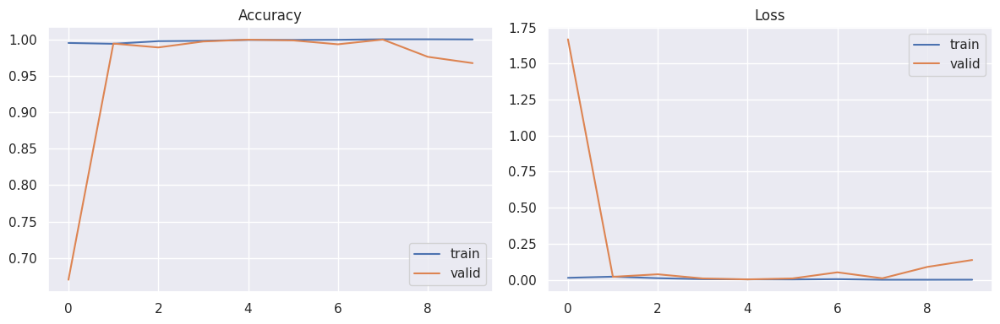

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
fig, axs = plt.subplots(ncols=2, figsize=(12, 4))

axs[0].plot(model_info.epoch, model_info.history['accuracy'], label='train')
axs[0].plot(model_info.epoch, model_info.history['val_accuracy'], label='valid')
axs[0].set_title('Accuracy')
axs[0].legend()

axs[1].plot(model_info.epoch, model_info.history['loss'], label='train')
axs[1].plot(model_info.epoch, model_info.history['val_loss'], label='valid')
axs[1].set_title('Loss')
axs[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
model.save('my_model')


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

def test_model(paths, model, int_type):
    pred=[]
    for path in paths:
        if os.path.isfile(path):  # check if input path is a file
            path = os.path.dirname(path)  # extract directory path from file path
        _path = path
        label = None
        predict_label = None
        if int_type == 0:
            _path = _path + "/"
            label = 0
        else:
            _path = _path + "/"
            label = 1

        plt.figure(figsize=(30, 30))
        plt.subplots_adjust(top=None, bottom=None, left=None, right=None, wspace=0.2, hspace=0.5)

        lst_img_name = os.listdir(_path)
        if len(lst_img_name) < 2:
            return

        for i in range(1, 17, 1):
            th = np.random.randint(0, len(lst_img_name) - 1)
            plt.subplot(4, 4, i)

            if int_type == 0:
                img = cv2.imread(_path + "/" + lst_img_name[th], 0)
            else:
                img = cv2.imread(_path + "/" + lst_img_name[th], 0)
            img = cv2.resize(img, (280, 280))
            plt.imshow(img, cmap="gray")
            img = np.array(img).reshape(-1, 280, 280, 1)
            pred = model.predict(img)
            if pred > 0.5:
                predict_label = 1
            else:
                predict_label = 0
            if predict_label == label:
                plt.title(str(predict_label) + " correct")
            else:
                plt.title(str(predict_label) + " incorrect")
        plt.show()



1/1 [==============================] - 0s 21ms/step


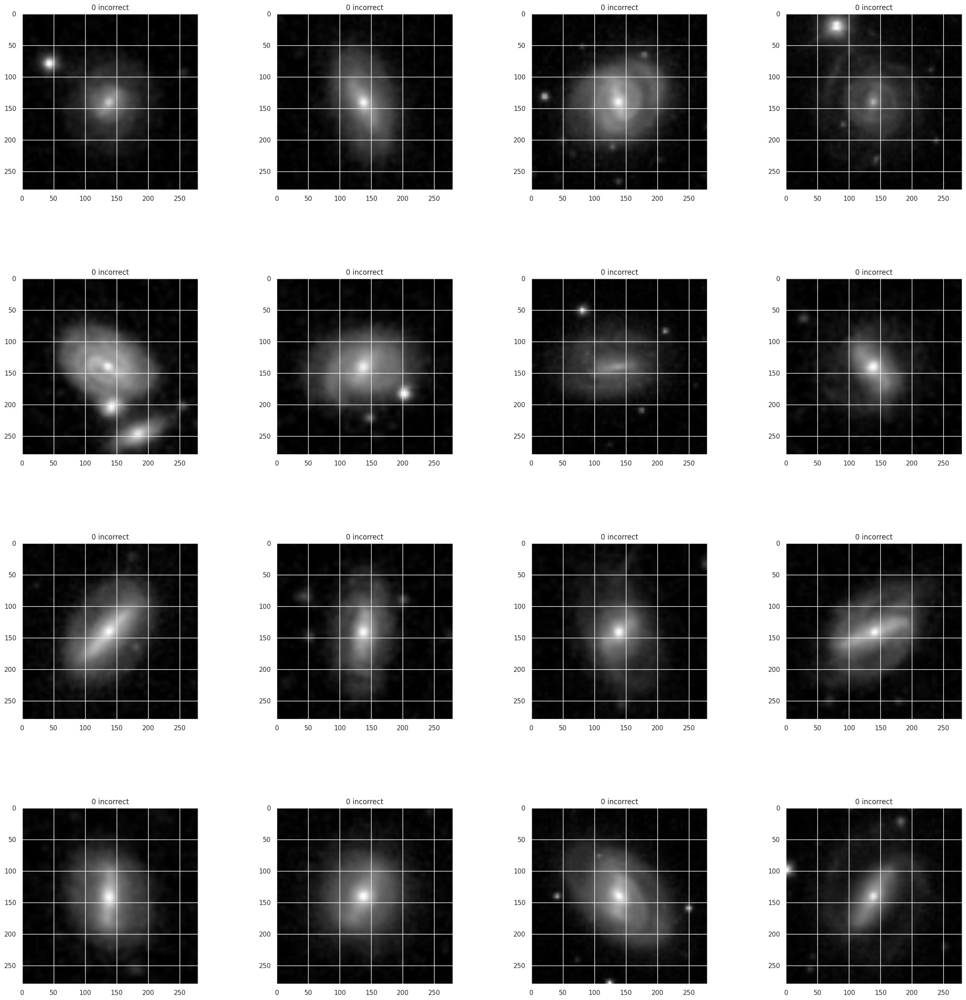

1/1 [==============================] - 0s 27ms/step


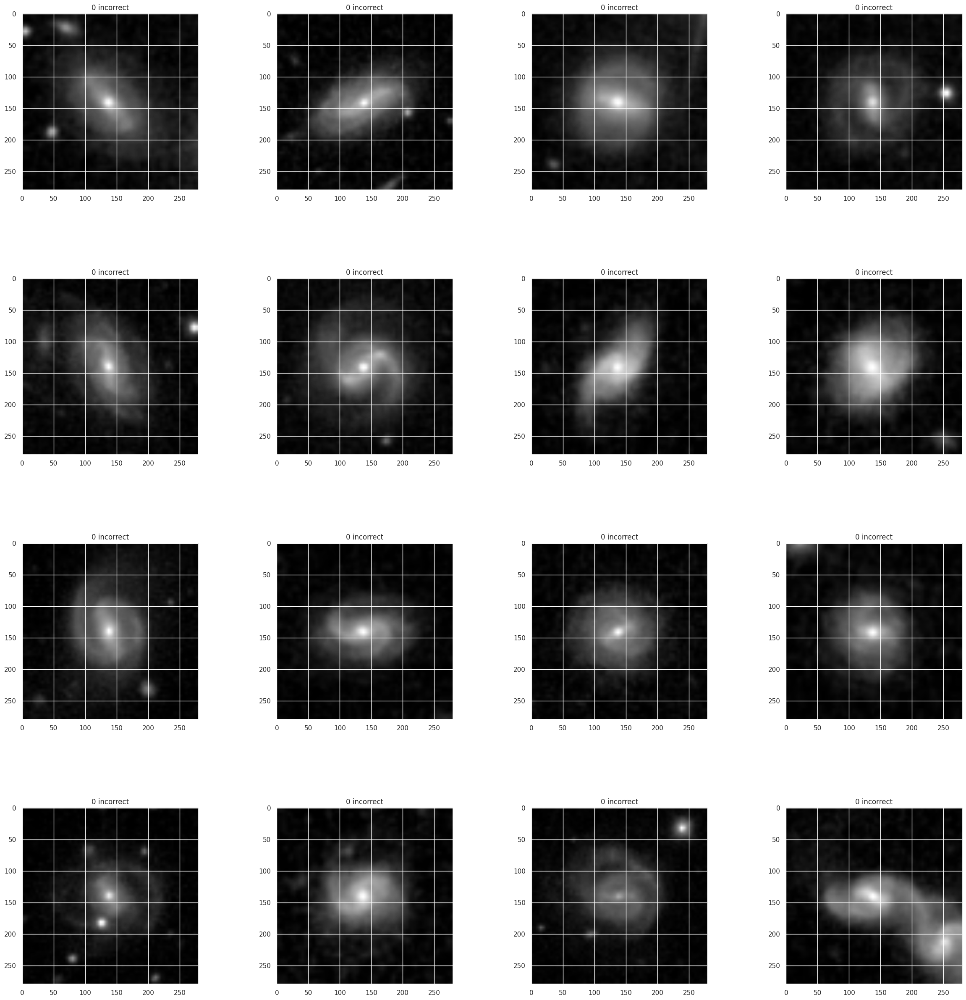

1/1 [==============================] - 0s 18ms/step


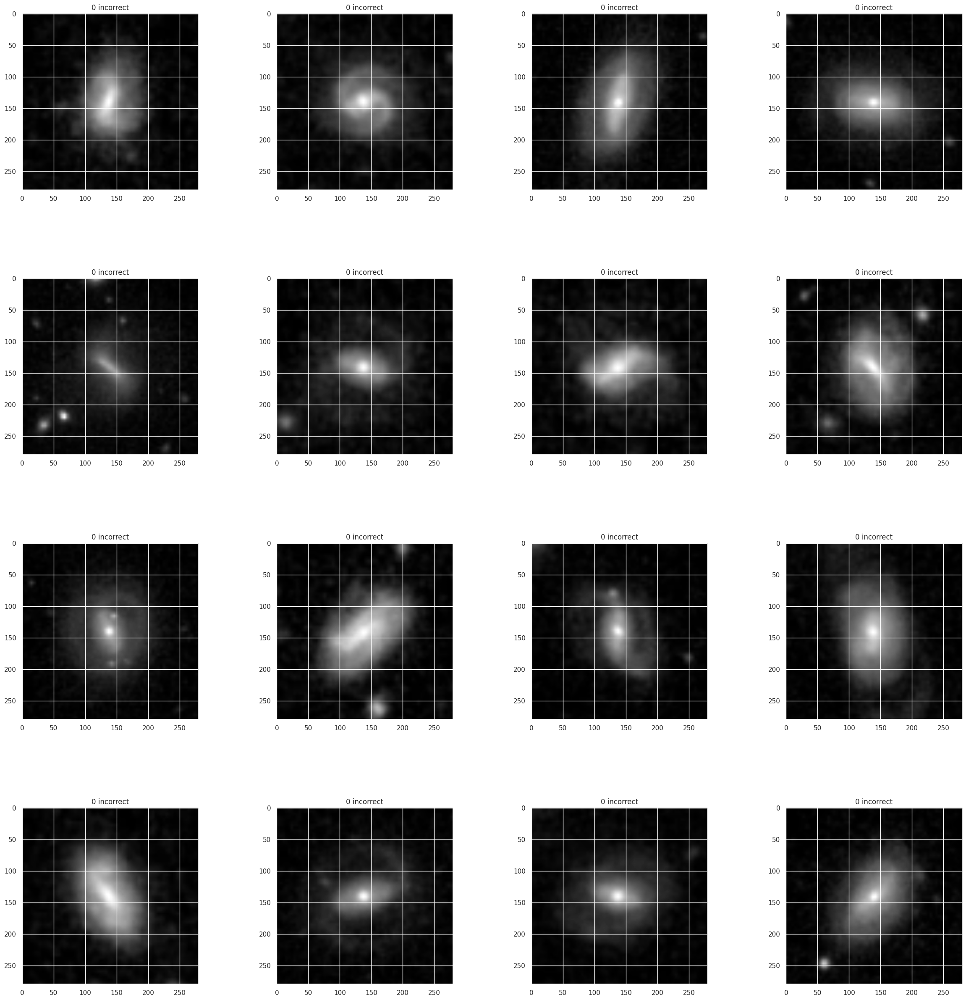

1/1 [==============================] - 0s 23ms/step


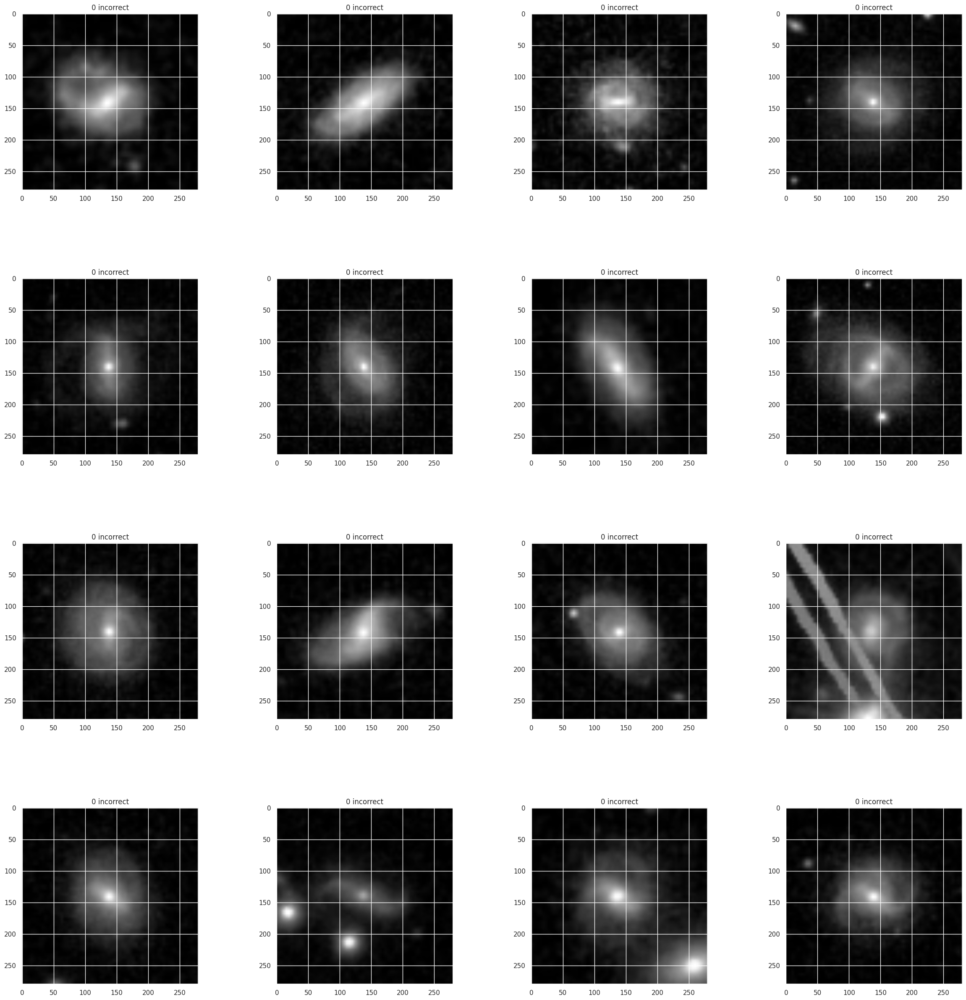

1/1 [==============================] - 0s 39ms/step


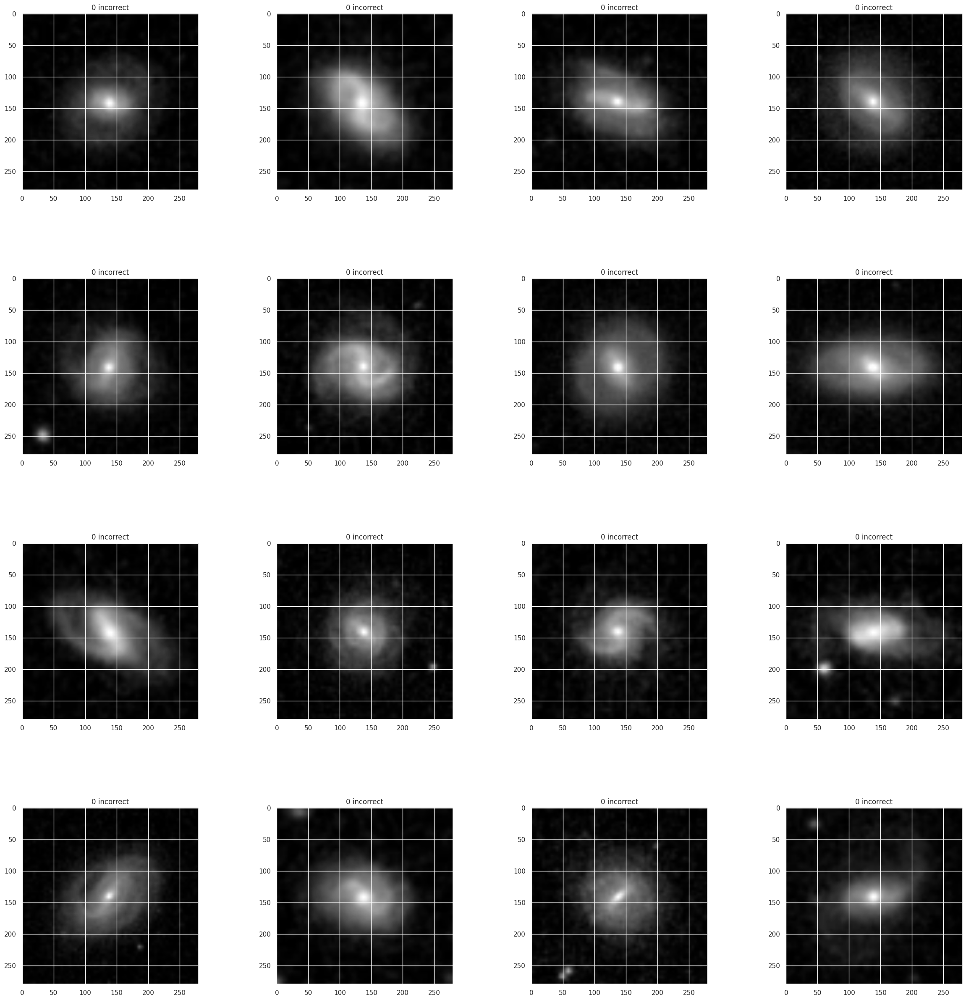

1/1 [==============================] - 0s 29ms/step


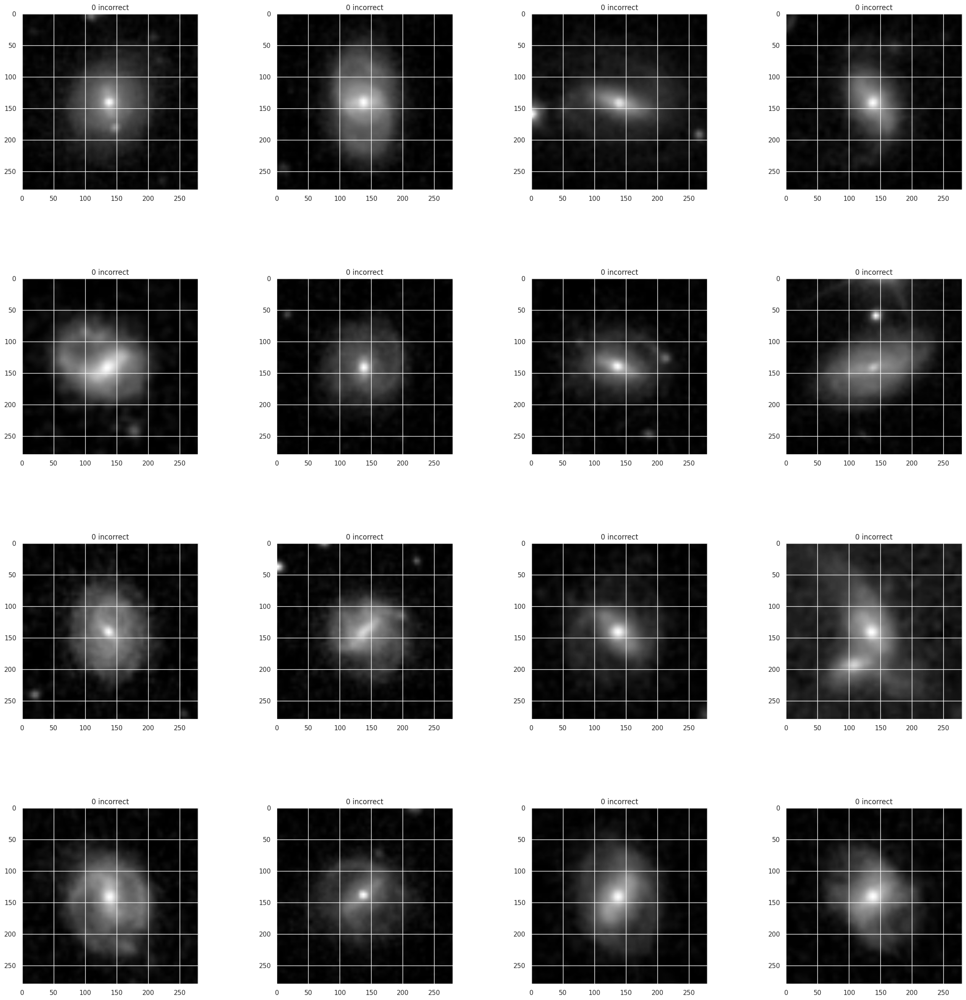

1/1 [==============================] - 0s 30ms/step


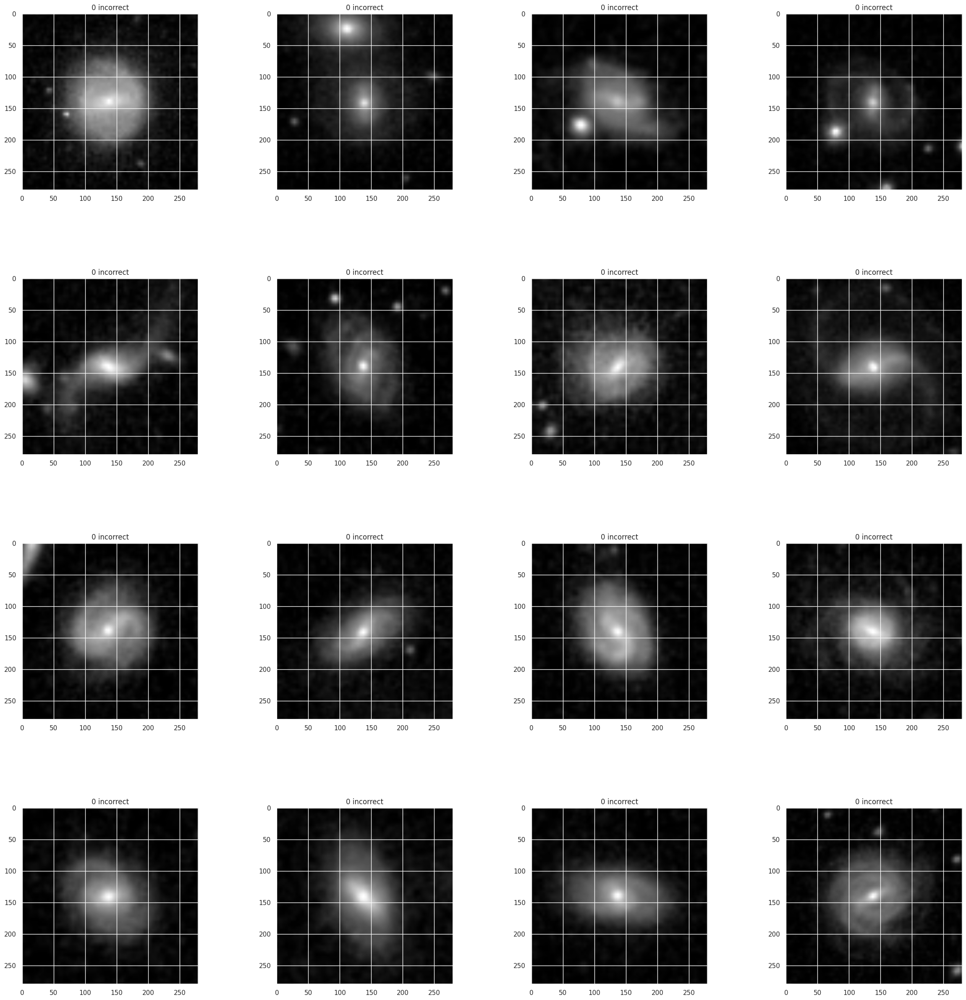

1/1 [==============================] - 0s 26ms/step


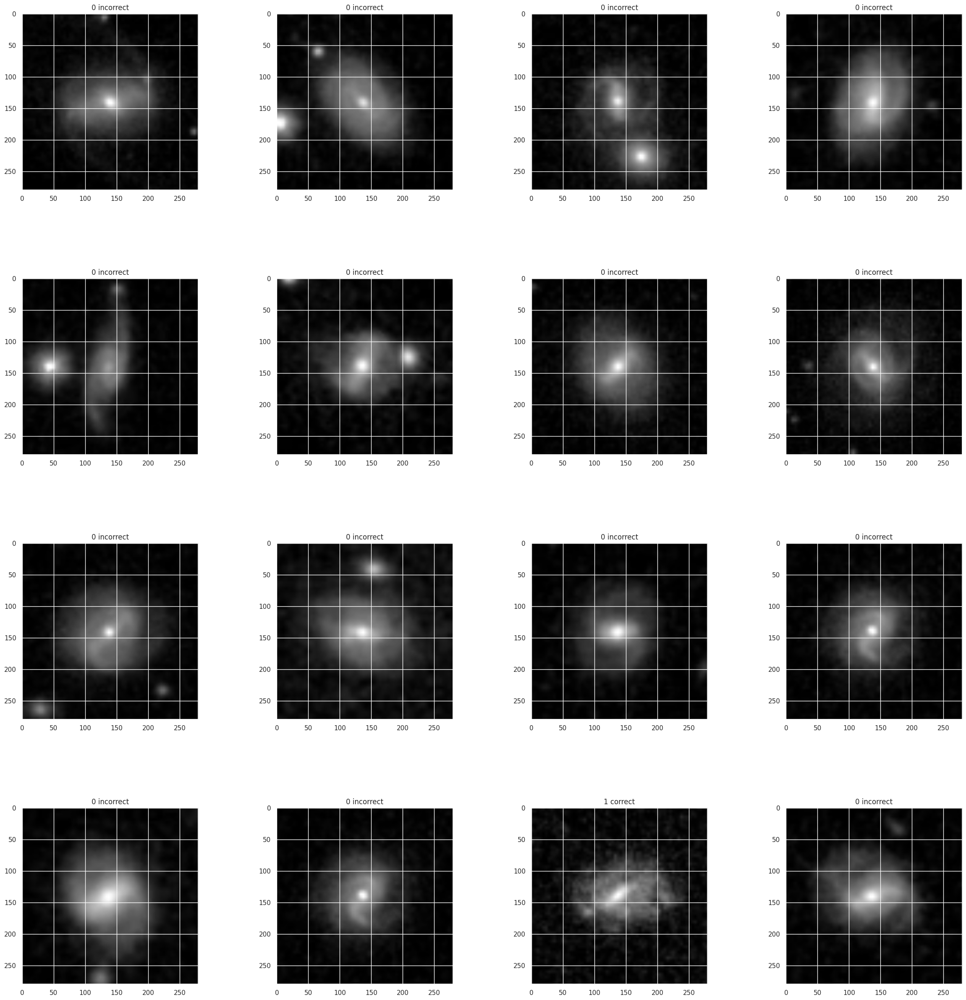

1/1 [==============================] - 0s 54ms/step


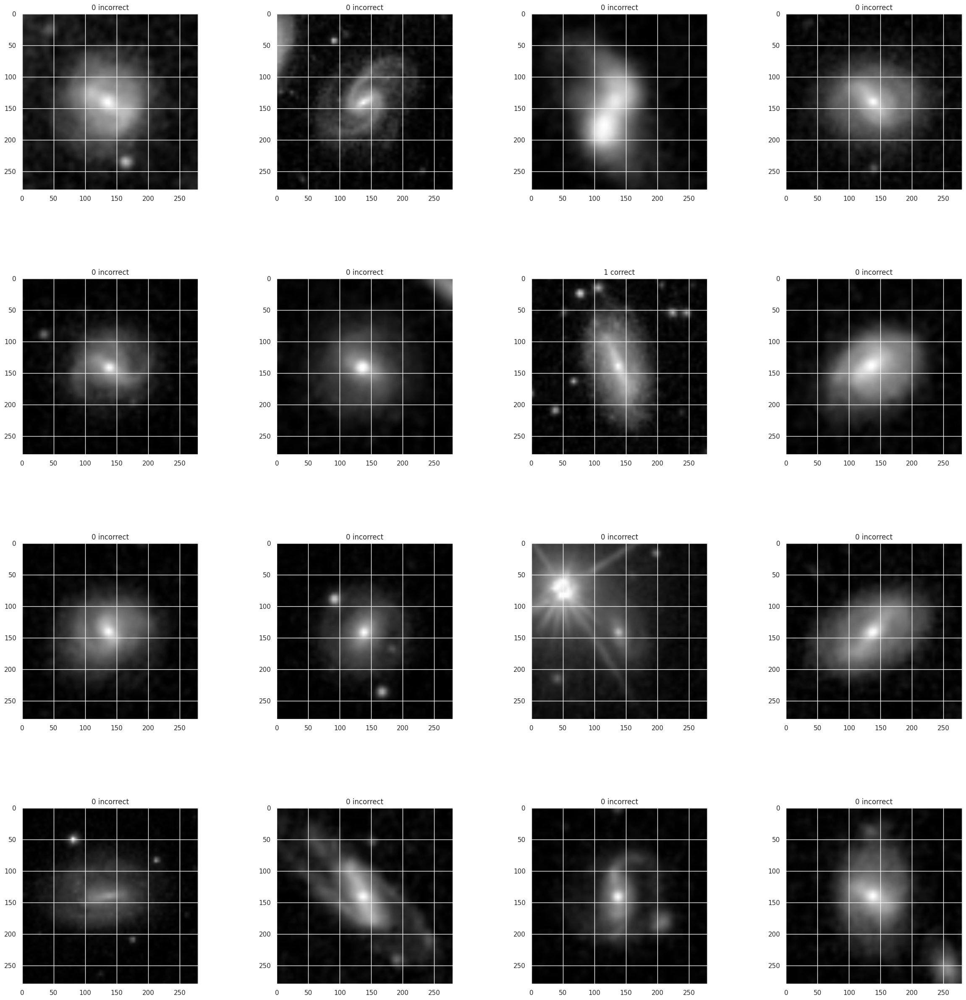

1/1 [==============================] - 0s 26ms/step


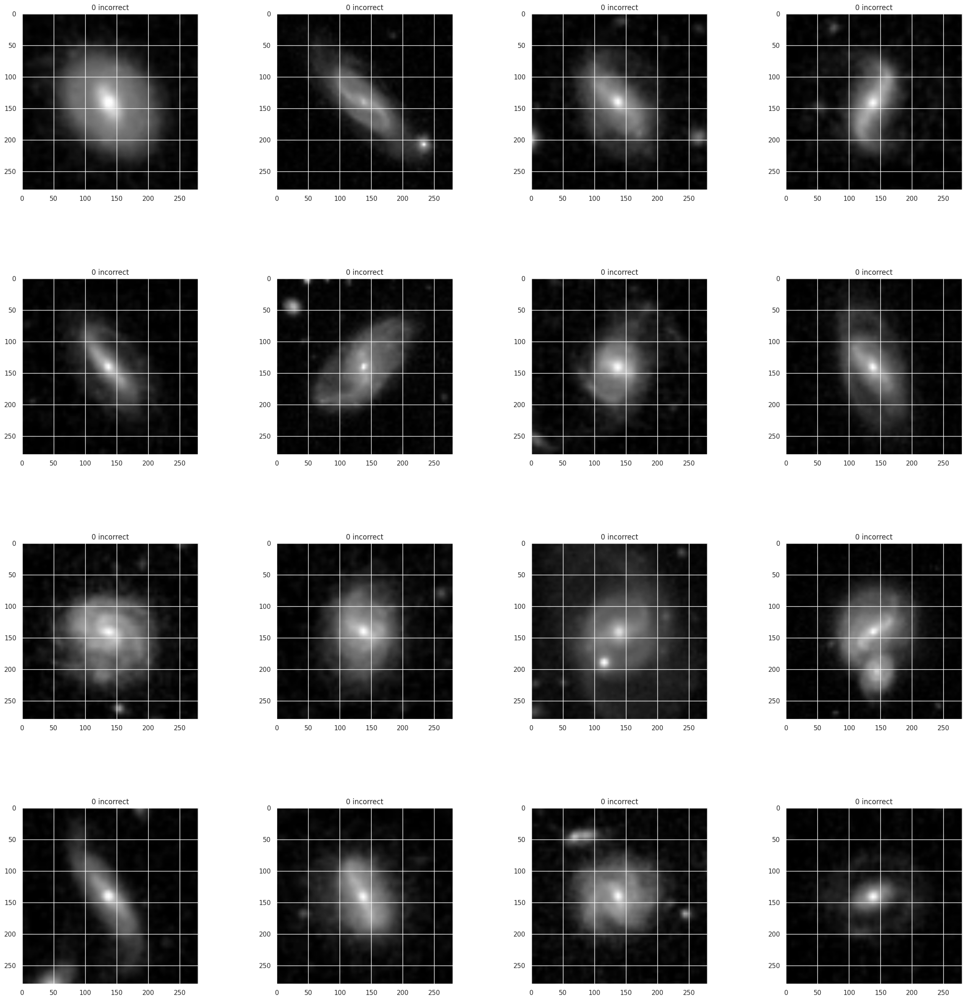

1/1 [==============================] - 0s 29ms/step


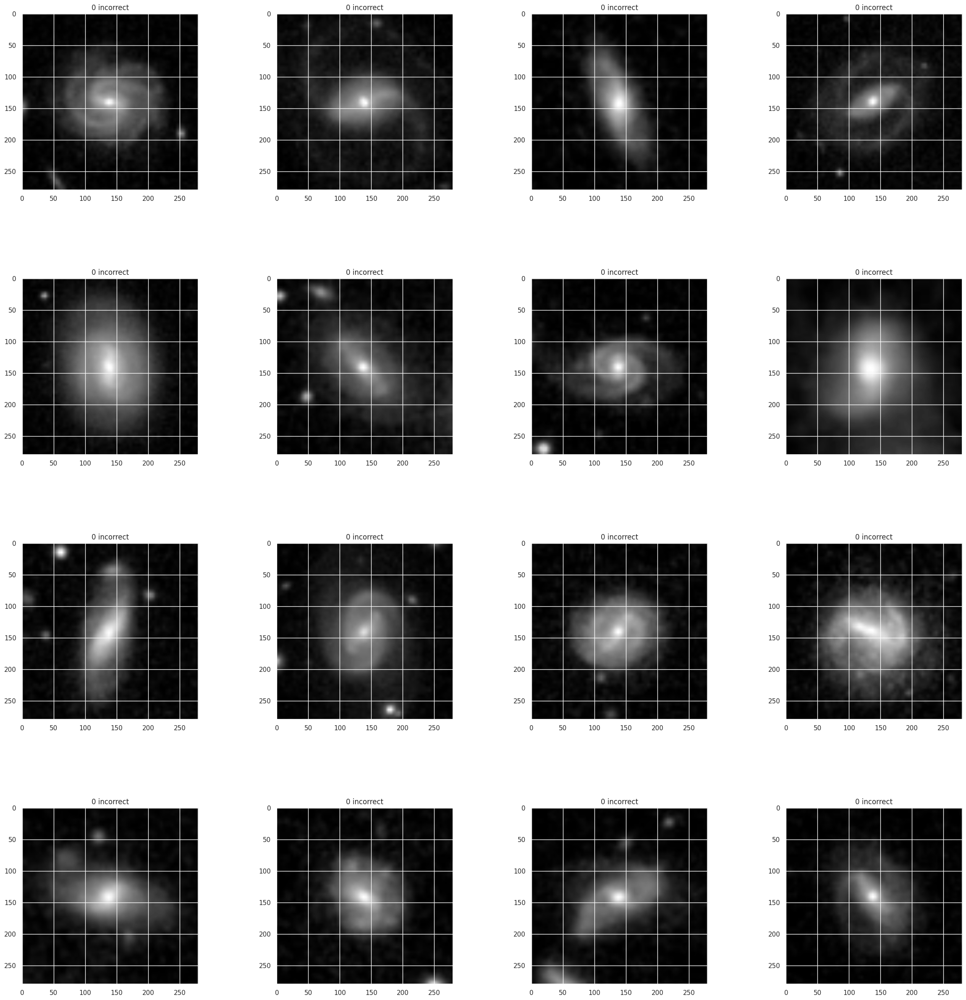

1/1 [==============================] - ETA: 0s

In [ ]:
test_model(real,model,1)